### Connect to Drive

In [1]:
#from google.colab import drive
#drive.mount('/gdrive')
#%cd /gdrive/My Drive/[2023-2024] AN2DL/Lecture 4

### Import libraries

In [1]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [2]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
print(tf.__version__)

2.14.0


In [3]:
# Import other libraries
import cv2
from tensorflow.keras.applications.mobilenet import preprocess_input
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
import seaborn as sns

In [4]:
import numpy as np
from PIL import Image
import imagehash

#### Load and clean the dataset

In [5]:
# Conditional check for unzipping
unzip = True

# Unzip the 'public_data.zip' file if the 'unzip' flag is True
if unzip:
    !unzip public_data.zip


Archive:  public_data.zip
  inflating: public_data.npz         


In [6]:
# Load the data from the file
file_path = 'public_data.npz'
loaded_data = np.load(file_path, allow_pickle=True)

# Access the 'data' and 'labels' arrays
data = loaded_data['data']
labels = loaded_data['labels']

In [15]:
# Access the 'data' and 'labels' arrays
data = loaded_data['data']
labels = loaded_data['labels']

# Create a list to store unique hashes and their corresponding indices
hashes = []
unique_indices = []
raw_images = []
duplicates = []
indices_duplicates = []

# Iterate through the images and calculate their perceptual hashes
for i, image in enumerate(data):
    pil_image = Image.fromarray(image.astype('uint8'))
    img_hash = imagehash.average_hash(pil_image)

    pil_image.info['label'] = labels[i]
    raw_images.append(pil_image)
    
    # Check if the hash is unique
    if img_hash not in hashes:
        hashes.append(img_hash)
        unique_indices.append(i)
    else:
        duplicates.append(pil_image)
        indices_duplicates.append(i)

# 

# Create a new numpy array with only the unique images
unique_data = data[unique_indices]

# Create a new numpy array with only the unique labels
unique_labels = labels[unique_indices]

duplicates_labels = labels[indices_duplicates]

# Save the cleaned dataset
np.savez('cleaned_data.npz', data=unique_data, labels=unique_labels)
np.savez('duplicates.npz', data=duplicates, labels=duplicates_labels)

In [16]:
# Load the data from the file
file_path = 'cleaned_data.npz'
loaded_data_cleaned = np.load(file_path, allow_pickle=True)

In [16]:
# Load the data from the file
file_path = 'duplicates.npz'
duplicates_file = np.load(file_path, allow_pickle=True)

duplicates_data = duplicates_file['data']
duplicates_labels = duplicates_file['labels']

# Create a folder to store the images
output_folder = 'duplicate_images'
os.makedirs(output_folder, exist_ok=True)

# Iterate through the images and save them to the folder
for i, image in enumerate(duplicates_data):
    image_filename = os.path.join(output_folder, f'{i}_{duplicates_labels[i]}.png')
    
    # Convert the numpy array to a PIL image
    pil_image = Image.fromarray(image.astype('uint8'))

    # Save the PIL image to a file
    pil_image.save(image_filename)

In [13]:
from PIL import Image, ExifTags

duplicates_data = duplicates_file['data']

# Create a folder to store the images
output_folder = 'duplicate_images'
os.makedirs(output_folder, exist_ok=True)

# Iterate through the images and save them to the folder
for i, image in enumerate(duplicates_data):
    image_filename = os.path.join(output_folder, f'image_{i}.png')
    
    # Convert the numpy array to a PIL image
    pil_image = Image.fromarray(image.astype('uint8'))

    # Save the PIL image to a file
    pil_image.save(image_filename)

In [17]:
data = loaded_data['data']

# Create a folder to store the images
output_folder = 'output_images'
os.makedirs(output_folder, exist_ok=True)

# Iterate through the images and save them to the folder
for i, image in enumerate(data):
    image_filename = os.path.join(output_folder, f'image_{i}.png')
    
    # Convert the numpy array to a PIL image
    pil_image = Image.fromarray(image.astype('uint8'))

    # Save the PIL image to a file
    pil_image.save(image_filename)

In [18]:
cleaned_data = loaded_data_cleaned['data']

# Create a folder to store the images
output_folder = 'output_images_cleaned'
os.makedirs(output_folder, exist_ok=True)

# Iterate through the images and save them to the folder
for i, image in enumerate(cleaned_data):
    image_filename = os.path.join(output_folder, f'image_{i}.png')
    
    # Convert the numpy array to a PIL image
    pil_image = Image.fromarray(image.astype('uint8'))

    # Save the PIL image to a file
    pil_image.save(image_filename)

In [21]:
import hashlib
import os
import filecmp

def calculate_file_hash(file_path):
    # Calculate the hash of a file
    hasher = hashlib.sha256()
    with open(file_path, "rb") as f:
        while chunk := f.read(8192):
            hasher.update(chunk)
    return hasher.hexdigest()

def compare_folders_by_content(folder1, folder2):
    files1 = [f for f in os.listdir(folder1) if os.path.isfile(os.path.join(folder1, f))]
    files2 = [f for f in os.listdir(folder2) if os.path.isfile(os.path.join(folder2, f))]

    hashes1 = {file: calculate_file_hash(os.path.join(folder1, file)) for file in files1}
    hashes2 = {file: calculate_file_hash(os.path.join(folder2, file)) for file in files2}

    files_only_in_folder1 = set(hashes1.keys()) - set(hashes2.keys())
    files_only_in_folder2 = set(hashes2.keys()) - set(hashes1.keys())

    return files_only_in_folder1, files_only_in_folder2

# Define the paths to the folders
raw_data_folder = 'output_images'
cleaned_data_folder = 'output_images_cleaned'

# Compare the contents of the two folders
comparison = filecmp.dircmp(raw_data_folder, cleaned_data_folder)

# Print the files that are only in the raw data folder
print("Files only in raw data folder:")
for file in comparison.left_only:
    print(file)

# Print the files that are only in the cleaned data folder
print("\nFiles only in cleaned data folder:")
for file in comparison.right_only:
    print(file)

Files only in raw data folder:
image_4852.png
image_4853.png
image_4854.png
image_4855.png
image_4856.png
image_4857.png
image_4858.png
image_4859.png
image_4860.png
image_4861.png
image_4862.png
image_4863.png
image_4864.png
image_4865.png
image_4866.png
image_4867.png
image_4868.png
image_4869.png
image_4870.png
image_4871.png
image_4872.png
image_4873.png
image_4874.png
image_4875.png
image_4876.png
image_4877.png
image_4878.png
image_4879.png
image_4880.png
image_4881.png
image_4882.png
image_4883.png
image_4884.png
image_4885.png
image_4886.png
image_4887.png
image_4888.png
image_4889.png
image_4890.png
image_4891.png
image_4892.png
image_4893.png
image_4894.png
image_4895.png
image_4896.png
image_4897.png
image_4898.png
image_4899.png
image_4900.png
image_4901.png
image_4902.png
image_4903.png
image_4904.png
image_4905.png
image_4906.png
image_4907.png
image_4908.png
image_4909.png
image_4910.png
image_4911.png
image_4912.png
image_4913.png
image_4914.png
image_4915.png
image_491

#### Load and process the dataset

In [5]:
# Conditional check for unzipping
unzip = True

# Unzip the 'animals.zip' file if the 'unzip' flag is True
if unzip:
    !unzip animals.zip

# Unzip the 'items.zip' file if the 'unzip' flag is True
    !unzip items.zip

Archive:  animals.zip
  inflating: animals/Orangutan-1024x535.jpg  
  inflating: animals/orangutan.jpg   
  inflating: animals/85493615.jpg    
  inflating: animals/help_farm_animals_9369131275_d78c8ff466_o.jpg  
  inflating: animals/Bobcat-Josie-Profile-768x512.jpg  
  inflating: animals/farm-animals-cow.jpg  
  inflating: animals/n02486410_baboon.JPEG  
  inflating: animals/n02489166_proboscis_monkey.JPEG  
  inflating: animals/n02480495_orangutan.JPEG  
  inflating: animals/giantpanda-001.jpg  
  inflating: animals/n02127052_lynx.JPEG  
  inflating: animals/n02454379_armadillo.JPEG  
  inflating: animals/n02110341_dalmatian.JPEG  
  inflating: animals/n02110958_pug.JPEG  
  inflating: animals/n02457408_three-toed_sloth.JPEG  
  inflating: animals/Rothschilds-Giraffe-1280x852-1.jpeg  
  inflating: animals/headshot-of-giraffe-sabi-sands-game-reserve-royalty-free-image-1573571360.jpg  
  inflating: animals/kYZCkffvs7uJHLRfXXYwxggon-91MsCHkdFXlaMq3Us.png  
  inflating: animals/n02111277

In [6]:
def load_images_from_folder(folder):
    images = []

    # Iterate through files in the specified folder
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))

        # Normalize image pixel values to a float range [0, 1]
        img = (img / 255).astype(np.float32)

        # Convert image from BGR to RGB
        img = img[...,::-1]

        # Make the image dataset squared
        dim = min(img.shape[:-1])
        img = img[(img.shape[0]-dim)//2:(img.shape[0]+dim)//2, (img.shape[1]-dim)//2:(img.shape[1]+dim)//2, :]

        # Resize the image to 224x224 pixels
        img = tfkl.Resizing(224, 224)(img)

        if img is not None:
            images.append(img)

    return np.array(images)

# Load images from the 'animals/' folder
animals_path = 'animals/'
animals = load_images_from_folder(animals_path)

# Load images from the 'items/' folder
items_path = 'items/'
items = load_images_from_folder(items_path)

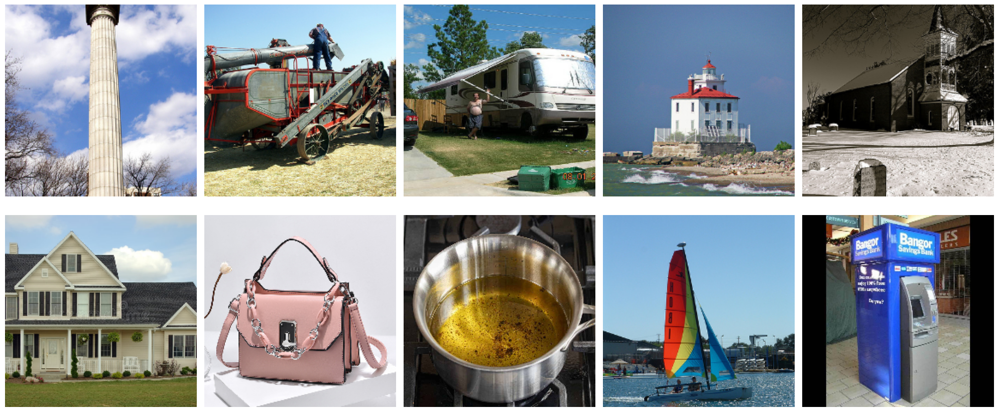

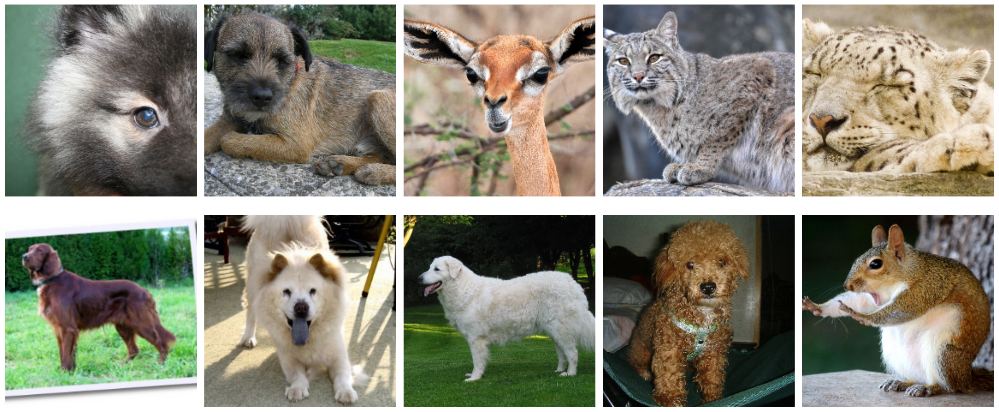

In [7]:
# Number of images to display
num_img = 10

# Create subplots for displaying items
fig, axes = plt.subplots(2, num_img//2, figsize=(20, 9))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(items[i], 0, 255))  # Display clipped item images
    ax.axis('off')
plt.tight_layout()
plt.show()

# Create subplots for displaying animals
fig, axes = plt.subplots(2, num_img//2, figsize=(20, 9))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(animals[i], 0, 255))  # Display clipped animal images
    ax.axis('off')
plt.tight_layout()
plt.show()

In [8]:
# Concatenate 'animals' and 'items' arrays along axis 0
X = np.concatenate([animals, items], axis=0)

# Create labels: 1 for 'animals', 0 for 'items'
y = np.concatenate([np.ones(len(animals)), np.zeros(len(items))], axis=0)

y = tfk.utils.to_categorical(y,len(np.unique(y)))

# Split data into train_val and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, random_state=seed, test_size=.25, stratify=np.argmax(y,axis=1))

# Further split train_val into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, random_state=seed, test_size=len(X_test), stratify=np.argmax(y_train_val,axis=1))

# Print shapes of the datasets
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

X_train shape: (120, 224, 224, 3), y_train shape: (120, 2)
X_val shape: (60, 224, 224, 3), y_val shape: (60, 2)
X_test shape: (60, 224, 224, 3), y_test shape: (60, 2)


In [9]:
# Define input shape, output shape, batch size, and number of epochs
input_shape = X_train.shape[1:]
output_shape = y_train.shape[1:]
batch_size = 32
epochs = 1000

# Print input shape, batch size, and number of epochs
print(f"Input Shape: {input_shape}, Output Shape: {output_shape}, Batch Size: {batch_size}, Epochs: {epochs}")

Input Shape: (224, 224, 3), Output Shape: (2,), Batch Size: 32, Epochs: 1000


In [10]:
callbacks = [
    tfk.callbacks.EarlyStopping(monitor='val_accuracy', patience=100, restore_best_weights=True, mode='auto'),
]

#### Train without augmentation

In [11]:
def build_model(input_shape=input_shape, output_shape=output_shape):
    tf.random.set_seed(seed)

    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    x = tfkl.Conv2D(filters=32, kernel_size=3, padding='same', name='conv0')(input_layer)
    x = tfkl.ReLU(name='relu0')(x)
    x = tfkl.MaxPooling2D(name='mp0')(x)

    x = tfkl.Conv2D(filters=64, kernel_size=3, padding='same', name='conv1')(x)
    x = tfkl.ReLU(name='relu1')(x)
    x = tfkl.MaxPooling2D(name='mp1')(x)

    x = tfkl.Conv2D(filters=128, kernel_size=3, padding='same', name='conv2')(x)
    x = tfkl.ReLU(name='relu2')(x)
    x = tfkl.MaxPooling2D(name='mp2')(x)

    x = tfkl.Conv2D(filters=256, kernel_size=3, padding='same', name='conv3')(x)
    x = tfkl.ReLU(name='relu3')(x)
    x = tfkl.MaxPooling2D(name='mp3')(x)

    x = tfkl.Conv2D(filters=512, kernel_size=3, padding='same', name='conv4')(x)
    x = tfkl.ReLU(name='relu4')(x)

    x = tfkl.GlobalAveragePooling2D(name='gap')(x)

    output_layer = tfkl.Dense(units=2, activation='softmax',name='Output')(x)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='CNN')

    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

    # Return the model
    return model

In [12]:
model = build_model()
model.summary()
tfk.utils.plot_model(model, expand_nested=True, show_shapes=True)

Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 224, 224, 3)]     0         
                                                                 
 conv0 (Conv2D)              (None, 224, 224, 32)      896       
                                                                 
 relu0 (ReLU)                (None, 224, 224, 32)      0         
                                                                 
 mp0 (MaxPooling2D)          (None, 112, 112, 32)      0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 64)      18496     
                                                                 
 relu1 (ReLU)                (None, 112, 112, 64)      0         
                                                                 
 mp1 (MaxPooling2D)          (None, 56, 56, 64)        0       

In [13]:
# Train the model
history = model.fit(
    x = X_train,
    y = y_train,
    batch_size = batch_size,
    epochs = epochs,
    validation_data = (X_val, y_val),
    callbacks = callbacks
).history

Epoch 1/1000
4/4 [==============================] - 3s 288ms/step - loss: 0.6962 - accuracy: 0.4583 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/1000
4/4 [==============================] - 0s 98ms/step - loss: 0.6970 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/1000
4/4 [==============================] - 0s 90ms/step - loss: 0.6920 - accuracy: 0.5417 - val_loss: 0.6873 - val_accuracy: 0.5000
Epoch 4/1000
4/4 [==============================] - 0s 93ms/step - loss: 0.6947 - accuracy: 0.5000 - val_loss: 0.6783 - val_accuracy: 0.5000
Epoch 5/1000
4/4 [==============================] - 0s 87ms/step - loss: 0.6804 - accuracy: 0.5917 - val_loss: 0.6664 - val_accuracy: 0.7167
Epoch 6/1000
4/4 [==============================] - 0s 84ms/step - loss: 0.6645 - accuracy: 0.6500 - val_loss: 0.6321 - val_accuracy: 0.6333
Epoch 7/1000
4/4 [==============================] - 0s 95ms/step - loss: 0.6072 - accuracy: 0.6917 - val_loss: 0.5826 - val_accuracy: 0.7500
Epoch 8/1000

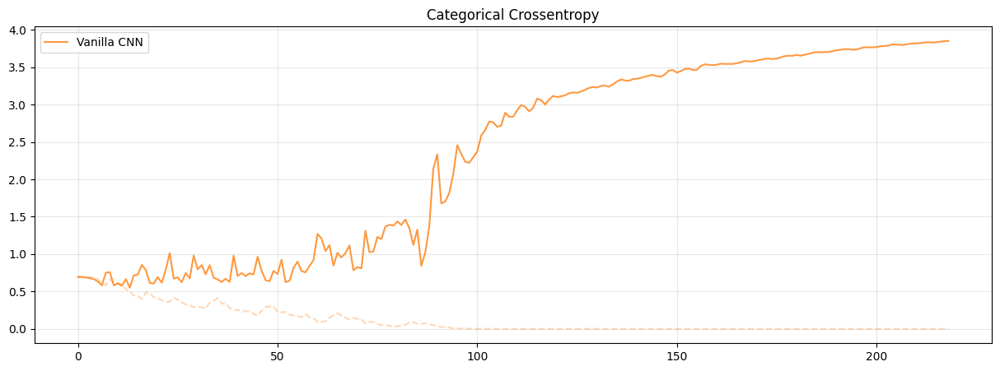

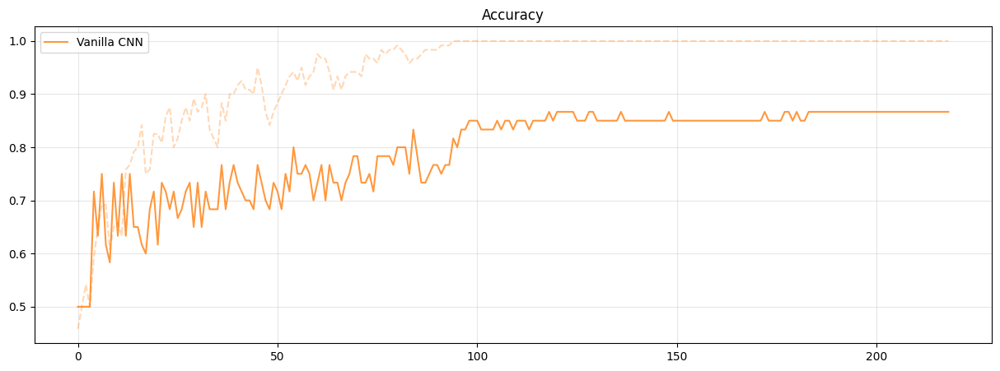

In [14]:
# Plot the training
plt.figure(figsize=(15,5))
plt.plot(history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(history['val_loss'], label='Vanilla CNN', alpha=.8, color='#ff7f0e')
plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(history['val_accuracy'], label='Vanilla CNN', alpha=.8, color='#ff7f0e')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

### Augmentation

In [15]:
num_img = 10 # Images to plot

#### Random Flip

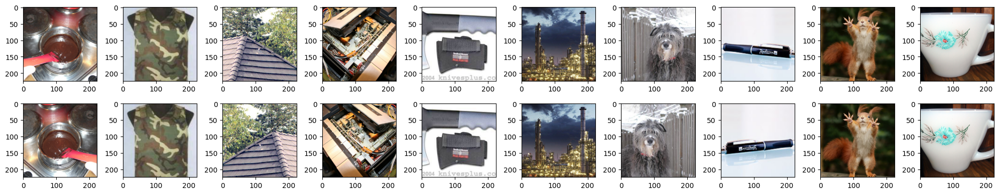

In [16]:
flip = tf.keras.Sequential([
  tfkl.RandomFlip("horizontal"),
])

X_train_flip = flip(X_train)

fig, axes = plt.subplots(2, num_img, figsize=(20,4))
for i in range(num_img):
    ax = axes[0,i%num_img]
    ax.imshow(X_train[i])
    ax = axes[1,i%num_img]
    ax.imshow(X_train_flip[i])
plt.tight_layout()
plt.show()

#### Random Translation

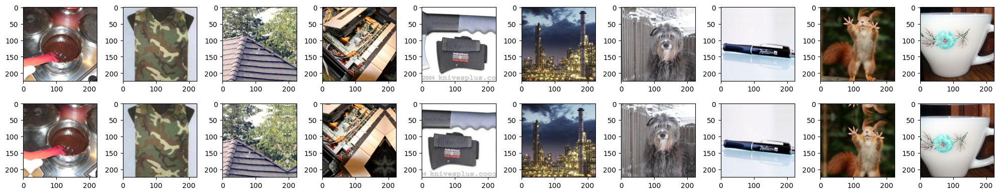

In [17]:
translation = tf.keras.Sequential([
  tfkl.RandomTranslation(0.2,0.2),
])

X_train_translation = translation(X_train)

fig, axes = plt.subplots(2, num_img, figsize=(20,4))
for i in range(num_img):
    ax = axes[0,i%num_img]
    ax.imshow(X_train[i])
    ax = axes[1,i%num_img]
    ax.imshow(X_train_translation[i])
plt.tight_layout()
plt.show()

#### Random Rotation

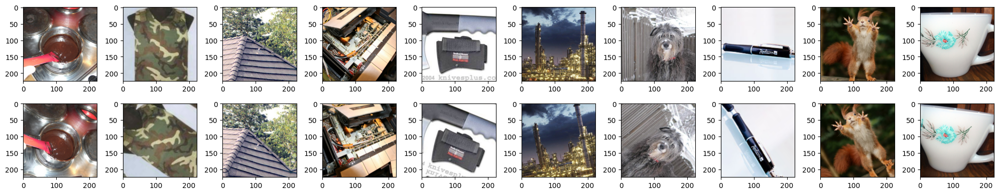

In [18]:
rotation = tf.keras.Sequential([
  tfkl.RandomRotation(0.2),
])

X_train_rotation = rotation(X_train)

fig, axes = plt.subplots(2, num_img, figsize=(20,4))
for i in range(num_img):
    ax = axes[0,i%num_img]
    ax.imshow(X_train[i])
    ax = axes[1,i%num_img]
    ax.imshow(X_train_rotation[i])
plt.tight_layout()
plt.show()

### Random Zoom

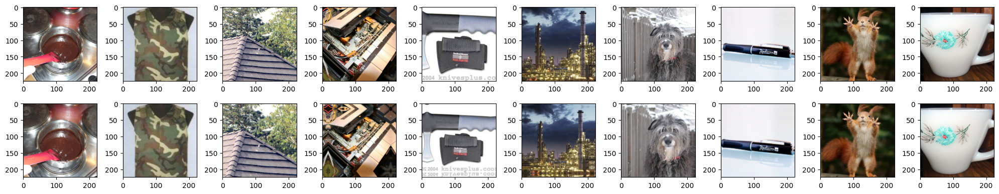

In [19]:
zoom = tf.keras.Sequential([
  tfkl.RandomZoom(0.2),
])

X_train_zoom = zoom(X_train)

fig, axes = plt.subplots(2, num_img, figsize=(20,4))
for i in range(num_img):
    ax = axes[0,i%num_img]
    ax.imshow(X_train[i])
    ax = axes[1,i%num_img]
    ax.imshow(X_train_zoom[i])
plt.tight_layout()
plt.show()

### Random Brightness

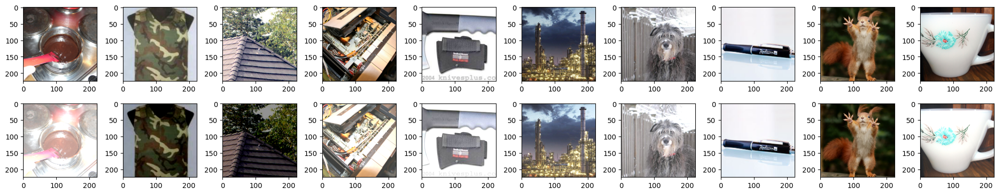

In [20]:
rotation = tf.keras.Sequential([
  tfkl.RandomBrightness(0.5, value_range=(0,1)),
])

X_train_rotation = rotation(X_train)

fig, axes = plt.subplots(2, num_img, figsize=(20,4))
for i in range(num_img):
    ax = axes[0,i%num_img]
    ax.imshow(X_train[i])
    ax = axes[1,i%num_img]
    ax.imshow(X_train_rotation[i])
plt.tight_layout()
plt.show()

### Random Contrast

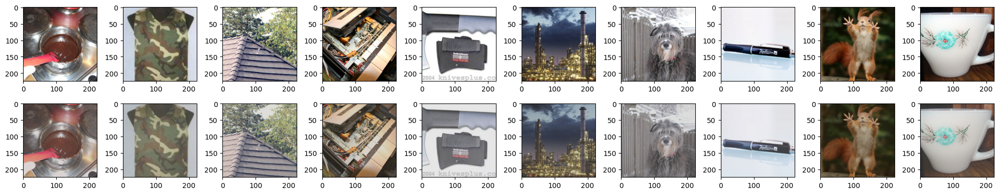

In [21]:
contrast = tf.keras.Sequential([
  tfkl.RandomContrast(0.75),
])

X_train_contrast = contrast(X_train)

fig, axes = plt.subplots(2, num_img, figsize=(20,4))
for i in range(num_img):
    ax = axes[0,i%num_img]
    ax.imshow(X_train[i])
    ax = axes[1,i%num_img]
    ax.imshow(np.clip(X_train_contrast[i], 0, 1))
plt.tight_layout()
plt.show()

#### Model with augmentation

In [22]:
def build_model_with_augmentation(input_shape=input_shape, output_shape=output_shape):
    tf.random.set_seed(seed)

    preprocessing = tf.keras.Sequential([
        tfkl.RandomBrightness(0.2, value_range=(0,1)),
        tfkl.RandomTranslation(0.2,0.2),
    ], name='preprocessing')

    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    preprocessing = preprocessing(input_layer)

    x = tfkl.Conv2D(filters=32, kernel_size=3, padding='same', name='conv0')(preprocessing)
    x = tfkl.ReLU(name='relu0')(x)
    x = tfkl.MaxPooling2D(name='mp0')(x)

    x = tfkl.Conv2D(filters=64, kernel_size=3, padding='same', name='conv1')(x)
    x = tfkl.ReLU(name='relu1')(x)
    x = tfkl.MaxPooling2D(name='mp1')(x)

    x = tfkl.Conv2D(filters=128, kernel_size=3, padding='same', name='conv2')(x)
    x = tfkl.ReLU(name='relu2')(x)
    x = tfkl.MaxPooling2D(name='mp2')(x)

    x = tfkl.Conv2D(filters=256, kernel_size=3, padding='same', name='conv3')(x)
    x = tfkl.ReLU(name='relu3')(x)
    x = tfkl.MaxPooling2D(name='mp3')(x)

    x = tfkl.Conv2D(filters=512, kernel_size=3, padding='same', name='conv4')(x)
    x = tfkl.ReLU(name='relu4')(x)

    x = tfkl.GlobalAveragePooling2D(name='gap')(x)

    output_layer = tfkl.Dense(units=2, activation='softmax',name='Output')(x)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='CNN')

    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

    # Return the model
    return model

In [23]:
augmented_model = build_model_with_augmentation()
augmented_model.summary()
tfk.utils.plot_model(augmented_model, expand_nested=True, show_shapes=True)

Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 224, 224, 3)]     0         
                                                                 
 preprocessing (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 conv0 (Conv2D)              (None, 224, 224, 32)      896       
                                                                 
 relu0 (ReLU)                (None, 224, 224, 32)      0         
                                                                 
 mp0 (MaxPooling2D)          (None, 112, 112, 32)      0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 64)      18496     
                                                                 
 relu1 (ReLU)                (None, 112, 112, 64)      0       

In [24]:
# Train the model
aug_history = augmented_model.fit(
    x = X_train,
    y = y_train,
    batch_size = batch_size,
    epochs = epochs,
    validation_data = (X_val, y_val),
    callbacks = callbacks
).history

Epoch 1/1000
4/4 [==============================] - 2s 283ms/step - loss: 0.7061 - accuracy: 0.4750 - val_loss: 0.6943 - val_accuracy: 0.5000
Epoch 2/1000
4/4 [==============================] - 0s 125ms/step - loss: 0.6979 - accuracy: 0.5000 - val_loss: 0.6941 - val_accuracy: 0.5000
Epoch 3/1000
4/4 [==============================] - 0s 108ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6926 - val_accuracy: 0.5000
Epoch 4/1000
4/4 [==============================] - 0s 107ms/step - loss: 0.6922 - accuracy: 0.5750 - val_loss: 0.6901 - val_accuracy: 0.6500
Epoch 5/1000
4/4 [==============================] - 0s 102ms/step - loss: 0.6890 - accuracy: 0.5417 - val_loss: 0.6824 - val_accuracy: 0.5333
Epoch 6/1000
4/4 [==============================] - 0s 100ms/step - loss: 0.6888 - accuracy: 0.5417 - val_loss: 0.6742 - val_accuracy: 0.5667
Epoch 7/1000
4/4 [==============================] - 0s 103ms/step - loss: 0.6739 - accuracy: 0.6167 - val_loss: 0.6628 - val_accuracy: 0.6167
Epoch 

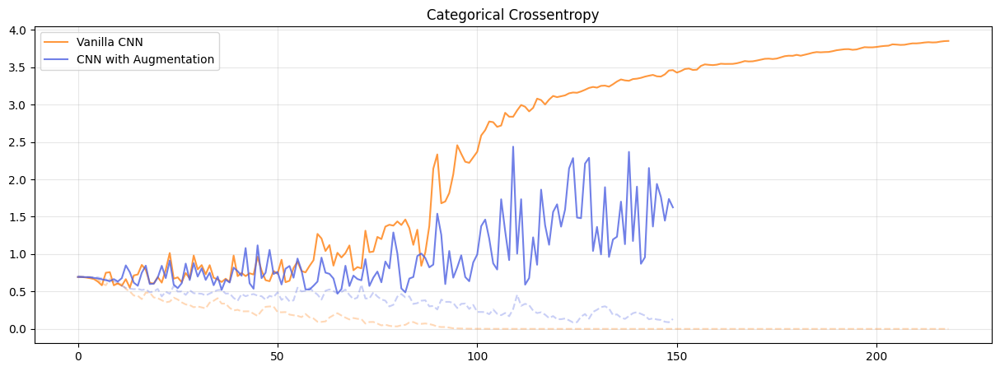

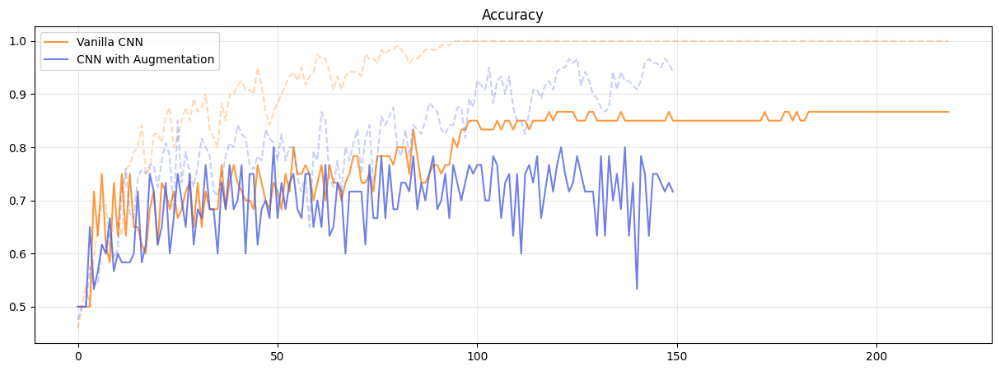

In [25]:
# Plot the training
plt.figure(figsize=(15,5))
plt.plot(history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(history['val_loss'], label='Vanilla CNN', alpha=.8, color='#ff7f0e')
plt.plot(aug_history['loss'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(aug_history['val_loss'], label='CNN with Augmentation', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(history['val_accuracy'], label='Vanilla CNN', alpha=.8, color='#ff7f0e')
plt.plot(aug_history['accuracy'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(aug_history['val_accuracy'], label='CNN with Augmentation', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [26]:
augmented_model.save('augmented_model')

### Make inference

In [27]:
# del augmented_model
augmented_model = tfk.models.load_model('augmented_model')

In [28]:
# Predict labels for the entire test set
predictions = augmented_model.predict(X_test, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (60, 2)


Accuracy: 0.7833
Precision: 0.7862
Recall: 0.7833
F1: 0.7828


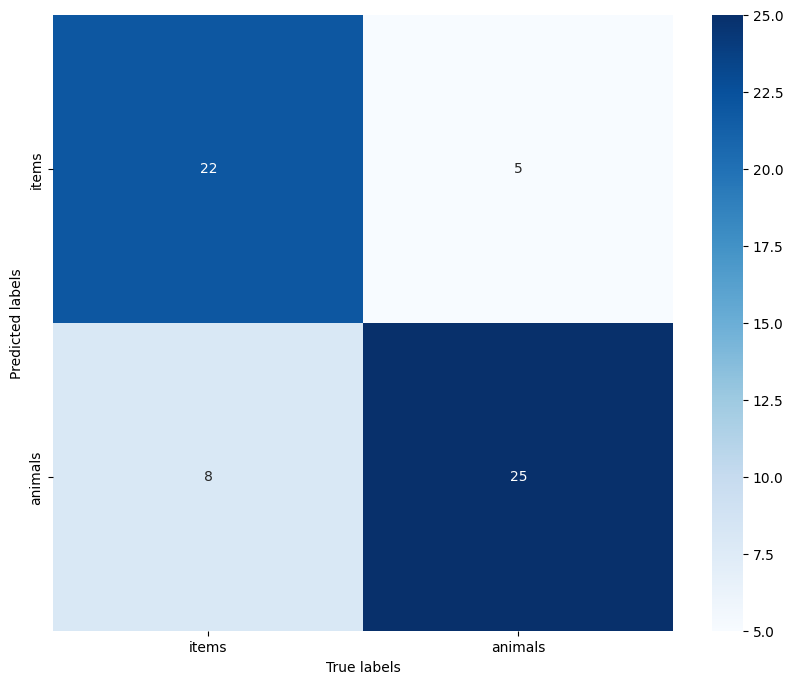

In [29]:
# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, xticklabels=list(('items','animals')), yticklabels=list(('items','animals')), cmap='Blues', annot=True)
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

### [EXTRA] Image retrieval

In [30]:
embedding = tfk.Sequential(augmented_model.layers[:-1])
embedding.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 conv0 (Conv2D)              (None, 224, 224, 32)      896       
                                                                 
 relu0 (ReLU)                (None, 224, 224, 32)      0         
                                                                 
 mp0 (MaxPooling2D)          (None, 112, 112, 32)      0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 64)      18496     
                                                                 
 relu1 (ReLU)                (None, 112, 112, 64)      0         
                                                                 
 mp1 (MaxPooling2D)          (None, 56, 56, 64)       

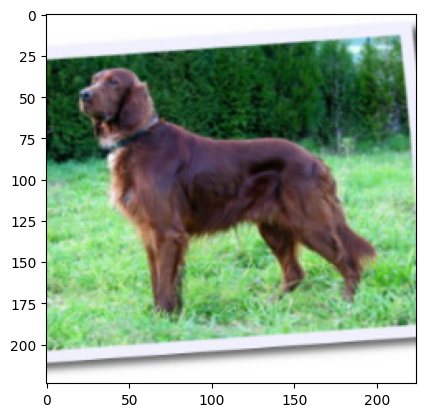

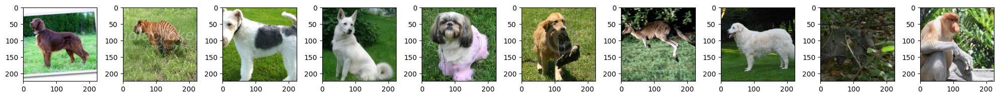

In [31]:
index = 1

image = np.expand_dims(X[index],axis=0)
image_features = embedding.predict(image,verbose=0)
plt.imshow(X[index])
plt.show()

dataset_features = embedding.predict(X,batch_size=32,verbose=0)
distances = np.mean(np.square(dataset_features - image_features),axis=-1)
ordered_images = X[distances.argsort()]

# Inspect the data
num_img = 10
fig, axes = plt.subplots(1, num_img, figsize=(20,20))
for i in range(num_img):
    ax = axes[i%num_img]
    ax.imshow(ordered_images[i])
plt.tight_layout()
plt.show()

*Credits: Eugenio Lomurno, 📧 eugenio.lomurno@polimi.it*